# Import Libraries

In [1]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
from swarmintelligence import Utilization
from scipy.stats import wilcoxon
import cv2
from sewar.full_ref import *

# Load Experiments Results

In [2]:
# key inner join later
on=['image_name', 'thresholds']

## Single Method

In [3]:
# group each results by SI Methods
pso_kapur_results = pickle.load(open('results/evaluation/PSO/PSO_kapur_df.pkl', 'rb'))
ga_kapur_results = pickle.load(open('results/evaluation/GA/GA_kapur_df.pkl', 'rb'))
woa_kapur_results = pickle.load(open('results/evaluation/WOA/WOA_kapur_df.pkl', 'rb'))
gwo_kapur_results = pickle.load(open('results/evaluation/GWO/GWO_kapur_df.pkl', 'rb'))
sma_kapur_results = pickle.load(open('results/evaluation/SMA/SMA_kapur_df.pkl', 'rb'))
mem_gwo_kapur_results = pickle.load(open('results/evaluation/memGWO/memGWO_kapur_df.pkl', 'rb'))

In [4]:
mem_gwo_kapur_results.head()

,image_name,thresholds,fitness_function,obj,Mean best_thresholds,Mean CPU_time (seconds),Mean Fitness,Mean MSE,Mean RMSE,Mean PSNR,Mean SSIM,Mean UQI,Regions,CPU_time (seconds),Fitness,MSE,RMSE,PSNR,SSIM,UQI
0,AirplaneF16.tiff,2,kapur_entropy,max,"[71, 173]",2.425600,12.211474,2806.376312,52.975242,13.649345,0.761347,0.921776,"[[71, 255, 255, 255, 255, 255, 255, 255, 255, ...","[1.927145004272461, 3.1520016193389893, 1.9857...","[12.211474090566005, 12.211474090566005, 12.21...","[2806.3763122558594, 2806.3763122558594, 2806....","[52.97524244640943, 52.97524244640943, 52.9752...","[13.64934454910294, 13.64934454910294, 13.6493...","[0.761346872735969, 0.761346872735969, 0.76134...","[0.9217762274412886, 0.9217762274412886, 0.921..."
1,AirplaneF16.tiff,3,kapur_entropy,max,"[69, 127, 183]",2.212908,15.503894,1994.712143,44.662200,15.132001,0.798145,0.949481,"[[69, 255, 255, 255, 183, 255, 255, 255, 255, ...","[2.405129909515381, 2.6317431926727295, 2.7688...","[15.503893789532656, 15.503893789532656, 15.50...","[1994.712142944336, 1994.712142944336, 1994.71...","[44.66220038180313, 44.66220038180313, 44.6622...","[15.132001293919405, 15.132001293919405, 15.13...","[0.7981453760593136, 0.7981453760593136, 0.798...","[0.949480595306752, 0.949480595306752, 0.94948..."
2,AirplaneF16.tiff,4,kapur_entropy,max,"[66, 106, 145, 185]",1.816724,18.311313,1822.272596,42.687973,15.524716,0.812972,0.956896,"[[66, 255, 255, 255, 185, 255, 255, 255, 255, ...","[2.17159366607666, 1.9110729694366455, 2.09562...","[18.31182479020967, 18.311377936178886, 18.311...","[1821.3631782531738, 1823.1306648254395, 1821....","[42.67743172044417, 42.6981342077782, 42.67906...","[15.526838084914363, 15.522625649616597, 15.52...","[0.8128127620893262, 0.8125080958432692, 0.812...","[0.9568226745745343, 0.9567879526111035, 0.956..."
3,AirplaneF16.tiff,5,kapur_entropy,max,"[60, 89, 123, 156, 187]",1.673859,20.907125,1714.852283,41.410185,15.788784,0.814105,0.961199,"[[89, 255, 255, 187, 187, 187, 255, 255, 255, ...","[1.5158076286315918, 1.6827898025512695, 1.850...","[20.9081928811917, 20.90455827590819, 20.90832...","[1722.7836265563965, 1697.8788414001465, 1723....","[41.50642873768347, 41.20532540097392, 41.5170...","[15.768496253197196, 15.831736645881884, 15.76...","[0.815175644293204, 0.8115868195759958, 0.8148...","[0.9610780784884551, 0.9615658144316607, 0.960..."
4,Lena.png,2,kapur_entropy,max,"[97, 164]",1.689077,12.346365,2044.689766,45.218246,15.024529,0.630764,0.891673,"[[164, 164, 164, 164, 164, 164, 164, 164, 255,...","[1.6800310611724854, 1.9742097854614258, 1.834...","[12.346365101175513, 12.346365101175513, 12.34...","[2044.6897659301758, 2044.6897659301758, 2044....","[45.21824594044063, 45.21824594044063, 45.2182...","[15.02452937602985, 15.02452937602985, 15.0245...","[0.6307635952929036, 0.6307635952929036, 0.630...","[0.8916733985521984, 0.8916733985521984, 0.891..."


### Grouping by Metrics Evaluation

In [5]:
### ========== PSNR
ga_psnr = ga_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
pso_psnr = pso_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
woa_psnr = woa_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
gwo_psnr = gwo_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
sma_psnr = sma_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
mem_gwo_psnr = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()


ga_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GA', 'PSNR': 'PSNR GA'}, inplace=True)
pso_psnr.rename(columns={'Mean PSNR': 'Mean PSNR PSO','PSNR': 'PSNR PSO'}, inplace=True)
woa_psnr.rename(columns={'Mean PSNR': 'Mean PSNR WOA','PSNR': 'PSNR WOA'}, inplace=True)
gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GWO','PSNR': 'PSNR GWO'}, inplace=True)
sma_psnr.rename(columns={'Mean PSNR': 'Mean PSNR SMA', 'PSNR': 'PSNR SMA'}, inplace=True)
mem_gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR MemoryGWO','PSNR': 'PSNR MemoryGWO'}, inplace=True)


### ======== RMSE
ga_rmse = ga_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
pso_rmse = pso_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
woa_rmse = woa_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
gwo_rmse = gwo_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
sma_rmse = sma_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
mem_gwo_rmse = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()


ga_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GA', 'RMSE': 'RMSE GA'}, inplace=True)
pso_rmse.rename(columns={'Mean RMSE': 'Mean RMSE PSO','RMSE': 'RMSE PSO'}, inplace=True)
woa_rmse.rename(columns={'Mean RMSE': 'Mean RMSE WOA','RMSE': 'RMSE WOA'}, inplace=True)
gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GWO','RMSE': 'RMSE GWO'}, inplace=True)
sma_rmse.rename(columns={'Mean RMSE': 'Mean RMSE SMA', 'RMSE': 'RMSE SMA'}, inplace=True)
mem_gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE MemoryGWO','RMSE': 'RMSE MemoryGWO'}, inplace=True)


### ======== SSIM
ga_ssim = ga_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
pso_ssim = pso_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
woa_ssim = woa_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
gwo_ssim = gwo_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
sma_ssim = sma_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
mem_gwo_ssim = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()


ga_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GA', 'SSIM': 'SSIM GA'}, inplace=True)
pso_ssim.rename(columns={'Mean SSIM': 'Mean SSIM PSO','SSIM': 'SSIM PSO'}, inplace=True)
woa_ssim.rename(columns={'Mean SSIM': 'Mean SSIM WOA','SSIM': 'SSIM WOA'}, inplace=True)
gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GWO','SSIM': 'SSIM GWO'}, inplace=True)
sma_ssim.rename(columns={'Mean SSIM': 'Mean SSIM SMA', 'SSIM': 'SSIM SMA'}, inplace=True)
mem_gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM MemoryGWO','SSIM': 'SSIM MemoryGWO'}, inplace=True)


### ======== UQI
ga_uqi = ga_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
pso_uqi = pso_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
woa_uqi = woa_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
gwo_uqi = gwo_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
sma_uqi = sma_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
mem_gwo_uqi = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()


ga_uqi.rename(columns={'Mean UQI': 'Mean UQI GA', 'UQI': 'UQI GA'}, inplace=True)
pso_uqi.rename(columns={'Mean UQI': 'Mean UQI PSO','UQI': 'UQI PSO'}, inplace=True)
woa_uqi.rename(columns={'Mean UQI': 'Mean UQI WOA','UQI': 'UQI WOA'}, inplace=True)
gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI GWO','UQI': 'UQI GWO'}, inplace=True)
sma_uqi.rename(columns={'Mean UQI': 'Mean UQI SMA', 'UQI': 'UQI SMA'}, inplace=True)
mem_gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI MemoryGWO','UQI': 'UQI MemoryGWO'}, inplace=True)



### ======== Fitness Value
ga_fitness = ga_kapur_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
pso_fitness = pso_kapur_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
woa_fitness = woa_kapur_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
gwo_fitness = gwo_kapur_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
sma_fitness = sma_kapur_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
mem_gwo_fitness= mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()


ga_fitness.rename(columns={'Mean Fitness': 'Mean Fitness GA', 'Fitness': 'Fitness GA'}, inplace=True)
pso_fitness.rename(columns={'Mean Fitness': 'Mean Fitness PSO','Fitness': 'Fitness PSO'}, inplace=True)
woa_fitness.rename(columns={'Mean Fitness': 'Mean Fitness WOA','Fitness': 'Fitness WOA'}, inplace=True)
gwo_fitness.rename(columns={'Mean Fitness': 'Mean Fitness GWO','Fitness': 'Fitness GWO'}, inplace=True)
sma_fitness.rename(columns={'Mean Fitness': 'Mean Fitness SMA', 'Fitness': 'Fitness SMA'}, inplace=True)
mem_gwo_fitness.rename(columns={'Mean Fitness': 'Mean Fitness MemoryGWO','Fitness': 'Fitness MemoryGWO'}, inplace=True)


### ======== CPU Time
ga_cpu_time = ga_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
pso_cpu_time = pso_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
woa_cpu_time = woa_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
gwo_cpu_time = gwo_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
sma_cpu_time = sma_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
mem_gwo_cpu_time = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()


ga_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GA', 'CPU_time (seconds)': 'CPU_time (seconds) GA'}, inplace=True)
pso_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) PSO','CPU_time (seconds)': 'CPU_time (seconds) PSO'}, inplace=True)
woa_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) WOA','CPU_time (seconds)': 'CPU_time (seconds) WOA'}, inplace=True)
gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GWO','CPU_time (seconds)': 'CPU_time (seconds) GWO'}, inplace=True)
sma_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) SMA', 'CPU_time (seconds)': 'CPU_time (seconds) SMA'}, inplace=True)
mem_gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) MemoryGWO','CPU_time (seconds)': 'CPU_time (seconds) MemoryGWO'}, inplace=True)


### ========== Best Threshold
ga_threshold = ga_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
pso_threshold = pso_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
woa_threshold = woa_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
gwo_threshold = gwo_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
sma_threshold = sma_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
mem_gwo_threshold = mem_gwo_kapur_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()


ga_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds GA'}, inplace=True)
pso_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds PSO'}, inplace=True)
woa_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds WOA'}, inplace=True)
gwo_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds GWO'}, inplace=True)
sma_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds SMA'}, inplace=True)
mem_gwo_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds MemoryGWO'}, inplace=True)

### Merge Results

In [6]:
### ======== PSNR
psnr_merge = ga_psnr.merge(pso_psnr, on=on).merge(woa_psnr, on=on).merge(gwo_psnr, on=on).merge(sma_psnr, on=on).merge(mem_gwo_psnr, on=on)
psnr_merge = psnr_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== RMSE
rmse_merge = ga_rmse.merge(pso_rmse, on=on).merge(woa_rmse, on=on).merge(gwo_rmse, on=on).merge(sma_rmse, on=on).merge(mem_gwo_rmse, on=on)
rmse_merge = rmse_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== SSIM
ssim_merge = ga_ssim.merge(pso_ssim, on=on).merge(woa_ssim, on=on).merge(gwo_ssim, on=on).merge(sma_ssim, on=on).merge(mem_gwo_ssim, on=on)
ssim_merge = ssim_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== UQI
uqi_merge = ga_uqi.merge(pso_uqi, on=on).merge(woa_uqi, on=on).merge(gwo_uqi, on=on).merge(sma_uqi, on=on).merge(mem_gwo_uqi, on=on)
uqi_merge = uqi_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Fitness Value
fitness_merge = ga_fitness.merge(pso_fitness, on=on).merge(woa_fitness, on=on).merge(gwo_fitness, on=on).merge(sma_fitness, on=on).merge(mem_gwo_fitness, on=on)
fitness_merge = fitness_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== CPU Time
cpu_time_merge = ga_cpu_time.merge(pso_cpu_time, on=on).merge(woa_cpu_time, on=on).merge(gwo_cpu_time, on=on).merge(sma_cpu_time, on=on).merge(mem_gwo_cpu_time, on=on)
cpu_time_merge = cpu_time_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])


### ======== Best Threshold
threshold_merge = ga_threshold.merge(pso_threshold, on=on).merge(woa_threshold, on=on).merge(gwo_threshold, on=on).merge(sma_threshold, on=on).merge(mem_gwo_threshold, on=on)
threshold_merge = threshold_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### Find Best value in each metrics

In [7]:
algorithms = ['PSO', 'GA', 'WOA', 'GWO', 'SMA', 'MemoryGWO']

def findMaximumMetrics(list_of_values):
    return max(list_of_values)

def calculateStandardDeviation(list_of_values):
    return np.std(list_of_values)

In [8]:
for idx_algo, algo in enumerate(algorithms):
    # find the best value from 30 running each methods
    psnr_merge[f'Best PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(findMaximumMetrics)     
    rmse_merge[f'Best RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(findMaximumMetrics)     
    ssim_merge[f'Best SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(findMaximumMetrics)     
    uqi_merge[f'Best UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(findMaximumMetrics)     
    cpu_time_merge[f'Best CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(findMaximumMetrics)
    fitness_merge[f'Best Fitness {algo}'] = fitness_merge[f'Fitness {algo}'].apply(findMaximumMetrics)
    
    # calculate standard deviation
    psnr_merge[f'Std PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(calculateStandardDeviation)     
    rmse_merge[f'Std RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(calculateStandardDeviation)     
    ssim_merge[f'Std SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(calculateStandardDeviation)     
    uqi_merge[f'Std UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(calculateStandardDeviation)     
    cpu_time_merge[f'Std CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(calculateStandardDeviation)
    fitness_merge[f'Std Fitness {algo}'] = fitness_merge[f'Fitness {algo}'].apply(calculateStandardDeviation)

# Quantitative Image Analysis

## Mean PSNR

In [9]:
psnr_merge

thresholds  Mean PSNR GA   
image_name                                           
AirplaneF16.tiff      0            2     13.819740  \
                      1            3     14.799132   
                      2            4     15.565110   
                      3            5     15.917637   
Lena.png              4            2     13.978875   
                      5            3     16.656868   
                      6            4     18.127728   
                      7            5     18.892599   
Male.tiff             8            2     12.543192   
                      9            3     14.970217   
                      10           4     16.324032   
                      11           5     17.932123   
Mandrill.tiff         12           2     12.304584   
                      13           3     14.287099   
                      14           4     15.809138   
                      15           5     17.164366   
Peppers.tiff          16           2     12.248020   
                      17           3     14.773934   
                      18           4     16.722119   
                      19           5     18.044343   
Sailboat on lake.tiff 20           2     13.596368   
                      21           3     15.376791   
                      22           4     17.023212   
                      23           5     17.778595   

                                                                    PSNR GA   
image_name                                                                    
AirplaneF16.tiff      0   [13.121647088038833, 13.75298840590906, 13.985...  \
                      1   [14.775763688138014, 14.791097072258161, 13.99...   
                      2   [14.02805391434791, 18.766950432831106, 15.975...   
                      3   [15.533954102853848, 15.137686593845693, 17.10...   
Lena.png              4   [14.254463265702913, 12.963920904630555, 14.62...   
                      5   [17.1299751711631, 16.247728173416576, 16.9791...   
                      6   [17.808979174816887, 18.844447964731746, 18.92...   
                      7   [20.191960364201194, 18.065816085557223, 19.35...   
Male.tiff             8   [13.601998972341818, 10.687289635265248, 13.56...   
                      9   [15.081299344932845, 14.563172832243241, 13.78...   
                      10  [16.012092403374385, 17.32746644696482, 16.437...   
                      11  [15.937022257686365, 18.90999920840438, 17.407...   
Mandrill.tiff         12  [12.061313354724497, 11.7089253080273, 9.79593...   
                      13  [11.281344292061712, 17.106727954850253, 13.49...   
                      14  [17.29654914392749, 11.78302526008678, 17.2795...   
                      15  [15.246866133776887, 16.248988714416427, 17.92...   
Peppers.tiff          16  [11.305285906948182, 12.796936667933947, 11.42...   
                      17  [14.944727613601502, 16.20006079254659, 16.262...   
                      18  [17.14070348203629, 16.169403969984177, 16.244...   
                      19  [20.205064269702252, 19.335132205069357, 16.65...   
Sailboat on lake.tiff 20  [13.13976113675951, 13.115208120612118, 13.078...   
                      21  [15.21250768262292, 14.692531501148666, 17.529...   
                      22  [18.82203723704802, 18.699417684615497, 15.248...   
                      23  [17.428165816991267, 19.237589258861327, 20.09...   

                          Mean PSNR PSO   
image_name                                
AirplaneF16.tiff      0       13.654729  \
                      1       15.112634   
                      2       15.569760   
                      3       15.885823   
Lena.png              4       15.049941   
                      5       17.357586   
                      6       19.177959   
                      7       20.697899   
Male.tiff             8       13.200569   
                      9       16.259378   
                      10      18.258106   
       

In [10]:
# save results
metrics='PSNR'
psnr_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_kapur.xlsx')
psnr_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_kapur.xlsx')
psnr_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_psnr_kapur.xlsx')
psnr_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_psnr_kapur.xlsx')

## Mean RMSE

In [11]:
rmse_merge

thresholds  Mean RMSE GA   
image_name                                           
AirplaneF16.tiff      0            2     52.007114  \
                      1            3     46.474885   
                      2            4     42.699724   
                      3            5     40.959332   
Lena.png              4            2     51.387834   
                      5            3     37.775805   
                      6            4     31.803846   
                      7            5     29.213084   
Male.tiff             8            2     60.419718   
                      9            3     45.711745   
                      10           4     39.174755   
                      11           5     32.582667   
Mandrill.tiff         12           2     62.642456   
                      13           3     50.414137   
                      14           4     42.714019   
                      15           5     36.592500   
Peppers.tiff          16           2     62.547758   
                      17           3     46.961530   
                      18           4     37.480373   
                      19           5     32.538519   
Sailboat on lake.tiff 20           2     53.442148   
                      21           3     43.754841   
                      22           4     36.457260   
                      23           5     33.765715   

                                                                    RMSE GA   
image_name                                                                    
AirplaneF16.tiff      0   [56.29344486540554, 52.346874979595434, 50.967...  \
                      1   [46.532029636633006, 46.44995812618475, 50.906...   
                      2   [50.71512318616211, 29.389531214071962, 40.526...   
                      3   [42.642482047566155, 44.63297655638664, 35.596...   
Lena.png              4   [49.41024611621206, 57.32500947735089, 47.3212...   
                      5   [35.484723202379804, 39.27839848161166, 36.106...   
                      6   [32.8164215360301, 29.128477290093656, 28.8660...   
                      7   [24.94262527916118, 31.860264442529356, 27.454...   
Male.tiff             8   [53.264791556541056, 74.50333244755986, 53.466...   
                      9   [44.92366843184615, 47.684972753589996, 52.144...   
                      10  [40.35855053256345, 34.68700940584235, 38.4312...   
                      11  [40.70887189188044, 28.90947600637647, 34.3687...   
Mandrill.tiff         12  [63.602547751685, 66.23597217532, 82.554975306...   
                      13  [69.57816420065073, 35.57982295377703, 53.9364...   
                      14  [34.81069733422851, 65.67331177190134, 34.8790...   
                      15  [44.07546204721277, 39.27269861191368, 32.3657...   
Peppers.tiff          16  [69.38664439310708, 58.43773128035366, 68.4701...   
                      17  [45.63560366800854, 39.49454735894116, 39.2126...   
                      18  [35.440921571172, 39.63418953892857, 39.293849...   
                      19  [24.905024135771665, 27.528564807133993, 37.46...   
Sailboat on lake.tiff 20  [56.17616963953552, 56.33519142893686, 56.5768...   
                      21  [44.25015500143889, 46.9800641410458, 33.89125...   
                      22  [29.203729597745095, 29.618925284619447, 44.06...   
                      23  [34.28718964717533, 27.839454259565848, 25.231...   

                          Mean RMSE PSO   
image_name                                
AirplaneF16.tiff      0       52.942444  \
                      1       44.762281   
                      2       42.469753   
                      3       40.959446   
Lena.png              4       45.086448   
                      5       34.569558   
                      6       28.055901   
                      7       23.549016   
Male.tiff             8       55.784267   
                      9       39.226085   
                      10      31.183204   
       

In [12]:
# save results
metrics='RMSE'
rmse_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_kapur.xlsx')
rmse_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_kapur.xlsx')
rmse_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_rmse_kapur.xlsx')
rmse_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_rmse_kapur.xlsx')

## Mean SSIM

In [13]:
ssim_merge

thresholds  Mean SSIM GA   
image_name                                           
AirplaneF16.tiff      0            2      0.759855  \
                      1            3      0.787851   
                      2            4      0.783118   
                      3            5      0.785613   
Lena.png              4            2      0.612296   
                      5            3      0.683460   
                      6            4      0.714759   
                      7            5      0.739910   
Male.tiff             8            2      0.434698   
                      9            3      0.512750   
                      10           4      0.559396   
                      11           5      0.608059   
Mandrill.tiff         12           2      0.596437   
                      13           3      0.668699   
                      14           4      0.698969   
                      15           5      0.751421   
Peppers.tiff          16           2      0.555847   
                      17           3      0.606942   
                      18           4      0.657681   
                      19           5      0.690410   
Sailboat on lake.tiff 20           2      0.653605   
                      21           3      0.693668   
                      22           4      0.717990   
                      23           5      0.738913   

                                                                    SSIM GA   
image_name                                                                    
AirplaneF16.tiff      0   [0.7081502965667754, 0.7643454209458556, 0.773...  \
                      1   [0.7633305224155906, 0.806830695495749, 0.7542...   
                      2   [0.7638464071122821, 0.7184309278392543, 0.774...   
                      3   [0.8139683671478122, 0.7777483116412981, 0.752...   
Lena.png              4   [0.6131458826944337, 0.6114345361582778, 0.611...   
                      5   [0.6764527018766582, 0.6814020921712596, 0.660...   
                      6   [0.7173501457680104, 0.7161172218943627, 0.695...   
                      7   [0.7432150285403533, 0.7120336469674207, 0.749...   
Male.tiff             8   [0.4306725781049211, 0.3935221347874791, 0.441...   
                      9   [0.48748398451211905, 0.5103655367223398, 0.44...   
                      10  [0.5285372520050657, 0.6008125904097098, 0.545...   
                      11  [0.565682556736412, 0.6336591727562332, 0.5874...   
Mandrill.tiff         12  [0.5988785684534013, 0.5815452900266755, 0.503...   
                      13  [0.5627096940093287, 0.7101024020932191, 0.654...   
                      14  [0.712847270729321, 0.5891524062557165, 0.7097...   
                      15  [0.6538930532458161, 0.7395135870118404, 0.797...   
Peppers.tiff          16  [0.5656907190606827, 0.5452812308691225, 0.568...   
                      17  [0.6032758487000922, 0.6213719699091527, 0.598...   
                      18  [0.6514845846415359, 0.6471011664955117, 0.646...   
                      19  [0.7405486667862553, 0.7174683581886023, 0.646...   
Sailboat on lake.tiff 20  [0.6423328493745705, 0.6591968541146251, 0.652...   
                      21  [0.6486217556559639, 0.7240791075216333, 0.721...   
                      22  [0.7579595673293613, 0.7437286175056356, 0.744...   
                      23  [0.7269579065349319, 0.767055467875839, 0.8119...   

                          Mean SSIM PSO   
image_name                                
AirplaneF16.tiff      0        0.761606  \
                      1        0.798814   
                      2        0.809597   
                      3        0.809456   
Lena.png              4        0.631538   
                      5        0.705197   
                      6        0.747804   
                      7        0.772304   
Male.tiff             8        0.457969   
                      9        0.543865   
                      10       0.623447   
       

In [14]:
metrics='SSIM'
# save results
ssim_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_kapur.xlsx')
ssim_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_kapur.xlsx')
ssim_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_ssim_kapur.xlsx')
ssim_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_ssim_kapur.xlsx')

## Mean UQI

In [15]:
metrics='UQI'
# save results
uqi_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_kapur.xlsx')
uqi_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_kapur.xlsx')
uqi_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_uqi_kapur.xlsx')
uqi_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_uqi_kapur.xlsx')

## Mean CPU Time (Seconds)

In [16]:
metrics='CPU_time (seconds)'
# save results
cpu_time_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_kapur.xlsx')
cpu_time_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_kapur.xlsx')
cpu_time_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_cpu_time_kapur.xlsx')
cpu_time_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_cpu_time_kapur.xlsx')

## Mean Fitness

In [17]:
metrics='Fitness'
# save results
fitness_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_kapur.xlsx')
fitness_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_kapur.xlsx')
fitness_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_kapur.xlsx')
fitness_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_kapur.xlsx')

## Mean Thresholds

In [18]:
threshold_merge

thresholds       Mean Thresholds GA   
image_name                                                      
AirplaneF16.tiff      0            2                [80, 167]  \
                      1            3           [77, 126, 177]   
                      2            4      [62, 101, 146, 184]   
                      3            5  [55, 88, 121, 153, 188]   
Lena.png              4            2                [92, 161]   
                      5            3           [85, 134, 179]   
                      6            4      [73, 109, 146, 188]   
                      7            5  [64, 95, 128, 160, 191]   
Male.tiff             8            2                [85, 163]   
                      9            3           [60, 121, 181]   
                      10           4      [56, 100, 149, 194]   
                      11           5  [37, 78, 123, 166, 209]   
Mandrill.tiff         12           2                [79, 143]   
                      13           3           [58, 106, 159]   
                      14           4       [44, 88, 130, 171]   
                      15           5  [39, 70, 104, 138, 179]   
Peppers.tiff          16           2                [73, 143]   
                      17           3           [62, 113, 168]   
                      18           4       [48, 89, 135, 181]   
                      19           5  [43, 78, 116, 149, 185]   
Sailboat on lake.tiff 20           2                [93, 159]   
                      21           3           [72, 127, 174]   
                      22           4      [62, 106, 147, 188]   
                      23           5  [48, 82, 118, 152, 188]   

                              Mean Thresholds PSO      Mean Thresholds WOA   
image_name                                                                   
AirplaneF16.tiff      0                 [71, 173]                [71, 173]  \
                      1            [69, 127, 182]           [69, 126, 182]   
                      2       [66, 107, 146, 186]      [63, 102, 142, 185]   
                      3   [62, 93, 127, 159, 188]  [55, 86, 120, 153, 187]   
Lena.png              4                 [97, 165]                [97, 164]   
                      5            [82, 127, 176]           [81, 126, 175]   
                      6       [73, 112, 151, 186]       [65, 98, 138, 179]   
                      7   [65, 95, 128, 162, 195]  [62, 92, 126, 161, 192]   
Male.tiff             8                 [91, 172]                [90, 172]   
                      9            [61, 116, 174]           [60, 115, 174]   
                      10       [47, 90, 133, 176]       [46, 90, 135, 180]   
                      11  [41, 82, 123, 166, 216]  [38, 80, 122, 167, 218]   
Mandrill.tiff         12                [80, 144]                [79, 143]   
                      13            [45, 99, 152]            [44, 98, 152]   
                      14       [34, 74, 115, 160]       [32, 71, 113, 159]   
                      15  [30, 64, 100, 135, 170]   [29, 62, 98, 134, 170]   
Peppers.tiff          16                [75, 147]                [75, 146]   
                      17           [60, 112, 164]           [61, 112, 164]   
                      18       [46, 84, 128, 173]       [48, 89, 133, 179]   
                      19  [39, 74, 109, 149, 190]  [38, 74, 111, 151, 194]   
Sailboat on lake.tiff 20                [92, 163]                [92, 163]   
                      21           [73, 120, 170]           [73, 119, 170]   
                      22      [71, 112, 156, 194]      [69, 111, 156, 195]   
                      23  [64, 99, 133, 168, 199]  [49, 85, 122, 162, 197]   

                              Mean Thresholds GWO       Mean Thresholds SMA   
image_name                                                                    
AirplaneF16.tiff      0                 [71, 173]                 [85, 163]  \
                      1            [69, 127, 183]            [77, 132

In [19]:
threshold_merge.to_excel('results/evaluation/Merge/mean_thresholds_kapur.xlsx')

# Qualitative Image Analysis

In [20]:
# load test image benchmark in grayscale format
test_dataset_misc = pickle.load(open('datasets/test_dataset.pkl', 'rb'))
gray_misc_dataset = test_dataset_misc['gray']
gray_misc_dataset

{'AirplaneF16.tiff': array([[ 65, 199, 193, ..., 166, 164, 148],
        [ 54, 196, 192, ..., 179, 155, 140],
        [ 54, 197, 194, ..., 190, 159, 141],
        ...,
        [ 67, 213, 213, ..., 184, 176, 151],
        [ 68, 214, 214, ..., 166, 184, 167],
        [ 89,  86,  88, ..., 112, 111, 107]], dtype=uint8),
 'Lena.png': array([[162, 162, 162, ..., 170, 155, 128],
        [162, 162, 162, ..., 170, 155, 128],
        [162, 162, 162, ..., 170, 155, 128],
        ...,
        [ 43,  43,  50, ..., 104, 100,  98],
        [ 44,  44,  55, ..., 104, 105, 108],
        [ 44,  44,  55, ..., 104, 105, 108]], dtype=uint8),
 'Male.tiff': array([[130, 138, 140, ..., 115, 113, 111],
        [139, 134, 131, ..., 110, 117, 116],
        [141, 127, 131, ..., 109, 108, 107],
        ...,
        [102, 103, 103, ...,  76,  80,  89],
        [106, 102, 109, ...,  72,  69,  82],
        [ 98, 105, 116, ...,  85,  81,  89]], dtype=uint8),
 'Mandrill.tiff': array([[145,  56,  49, ..., 113, 153, 177],

## 2-Level

In [21]:
mLevel = 2
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,0,2,"[80, 167]","[71, 173]","[71, 173]","[71, 173]","[85, 163]","[71, 173]"
Lena.png,4,2,"[92, 161]","[97, 165]","[97, 164]","[97, 164]","[98, 168]","[97, 164]"
Male.tiff,8,2,"[85, 163]","[91, 172]","[90, 172]","[91, 172]","[0, 0]","[91, 172]"
Mandrill.tiff,12,2,"[79, 143]","[80, 144]","[79, 143]","[79, 143]","[9, 16]","[79, 143]"
Peppers.tiff,16,2,"[73, 143]","[75, 147]","[75, 146]","[75, 147]","[0, 0]","[75, 147]"
Sailboat on lake.tiff,20,2,"[93, 159]","[92, 163]","[92, 163]","[92, 163]","[20, 33]","[92, 163]"


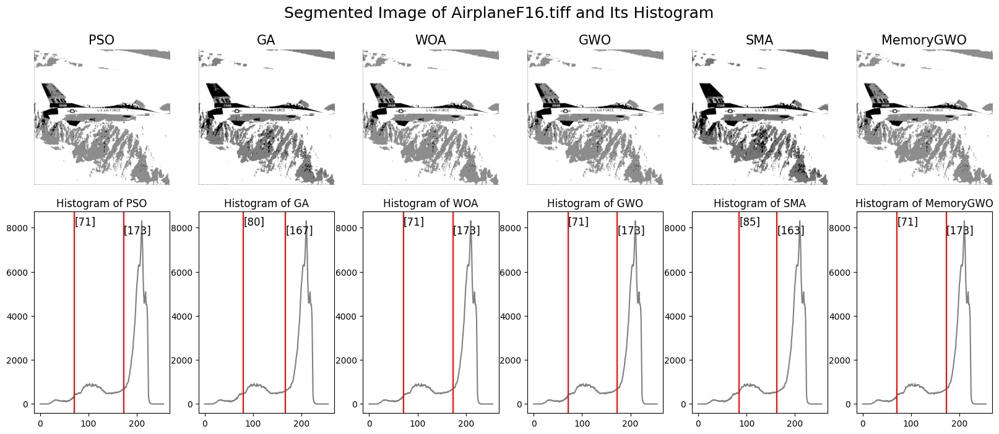

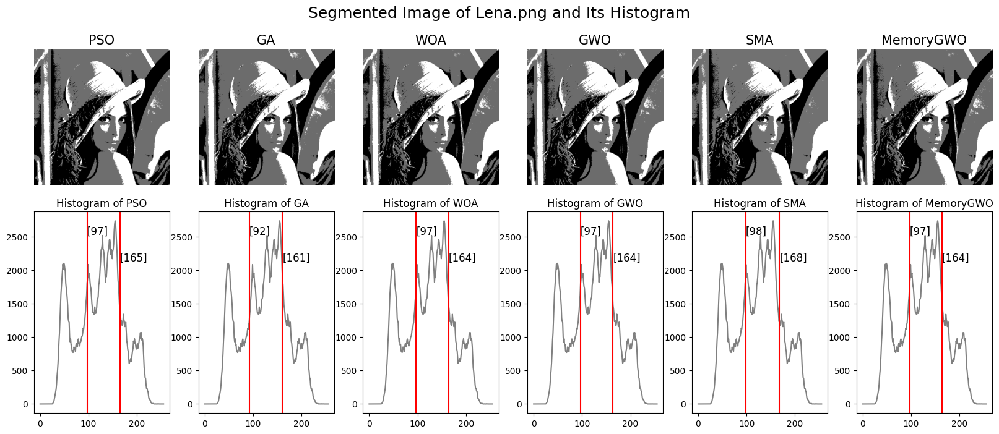

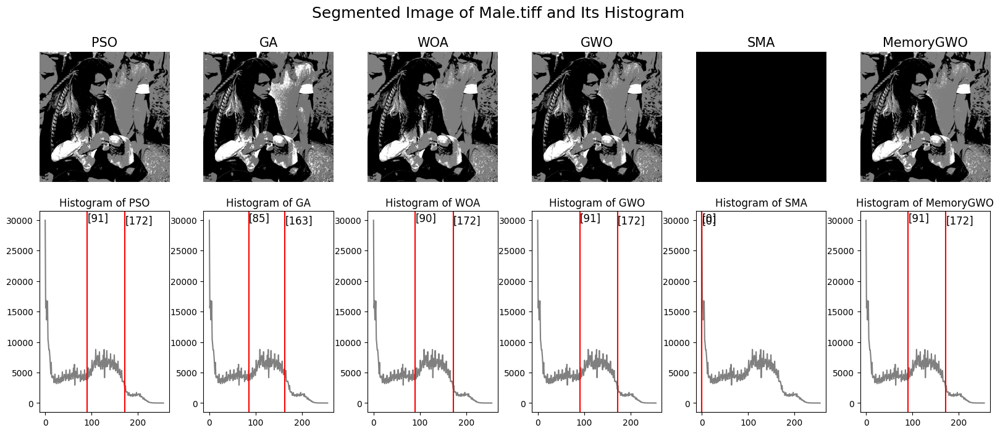

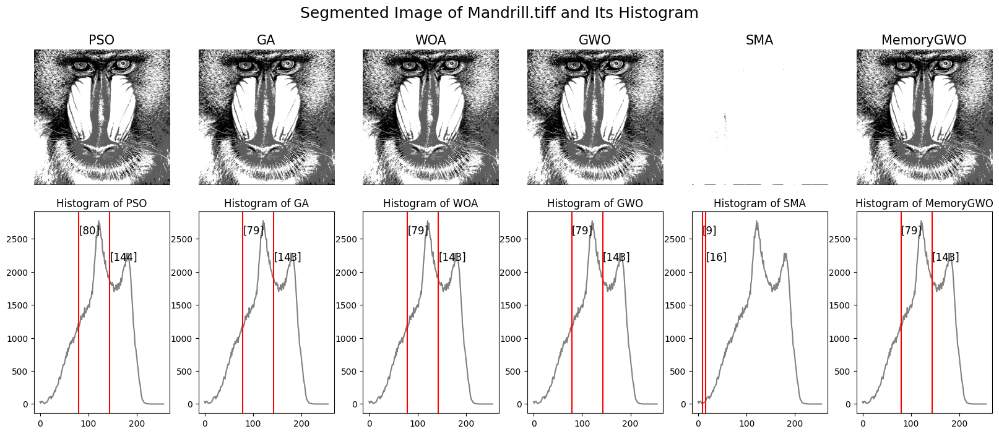

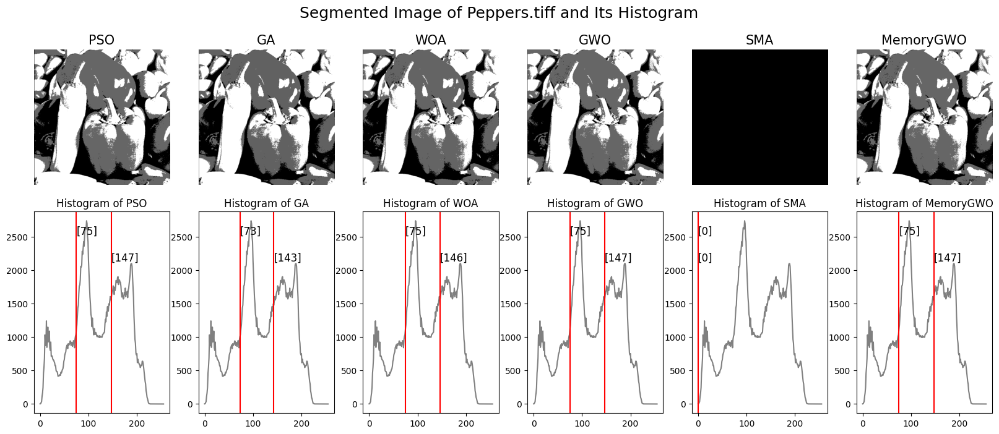

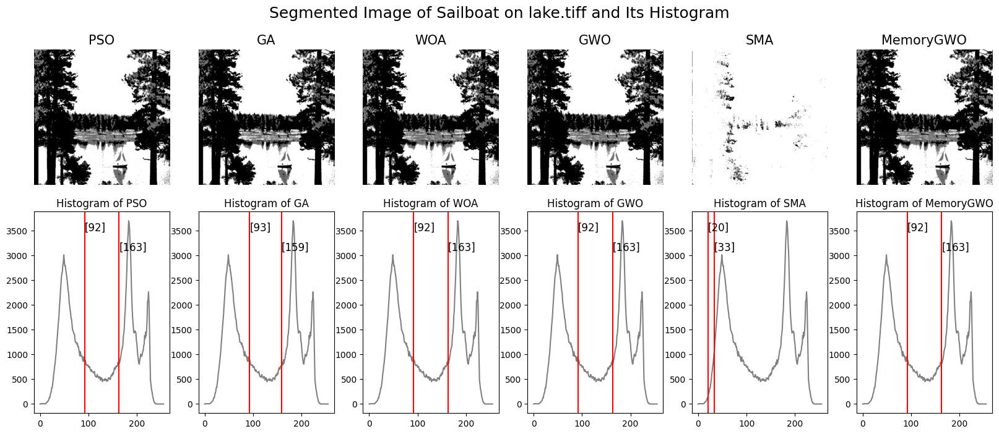

In [22]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, (ax_row1, ax_row2) = plt.subplots(nrows=2, ncols=len(algorithms), figsize=(16, 7))
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo))
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=400
    fig.suptitle('Segmented Image of {} and Its Histogram'.format(image_name), fontsize=18)
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)

## 3-Level

In [23]:
mLevel = 3
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,1,3,"[77, 126, 177]","[69, 127, 182]","[69, 126, 182]","[69, 127, 183]","[77, 132, 175]","[69, 127, 183]"
Lena.png,5,3,"[85, 134, 179]","[82, 127, 176]","[81, 126, 175]","[82, 126, 175]","[96, 139, 189]","[82, 126, 175]"
Male.tiff,9,3,"[60, 121, 181]","[61, 116, 174]","[60, 115, 174]","[62, 117, 174]","[51, 102, 158]","[61, 116, 174]"
Mandrill.tiff,13,3,"[58, 106, 159]","[45, 99, 152]","[44, 98, 152]","[45, 99, 152]","[46, 89, 139]","[45, 99, 152]"
Peppers.tiff,17,3,"[62, 113, 168]","[60, 112, 164]","[61, 112, 164]","[61, 113, 165]","[41, 73, 128]","[61, 113, 165]"
Sailboat on lake.tiff,21,3,"[72, 127, 174]","[73, 120, 170]","[73, 119, 170]","[73, 120, 170]","[65, 120, 179]","[73, 120, 170]"


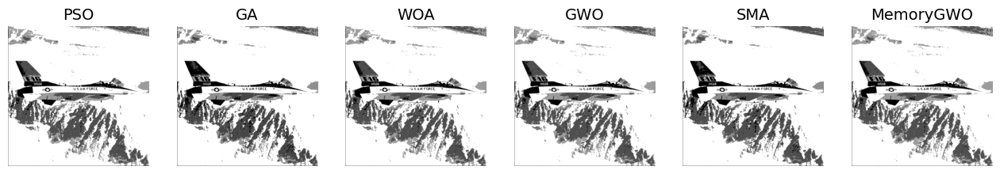

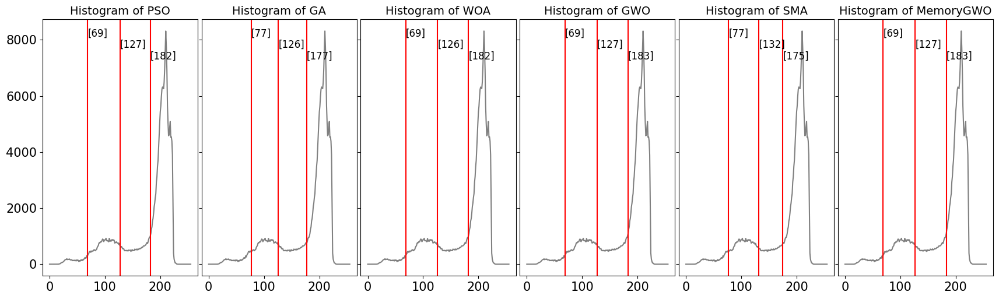

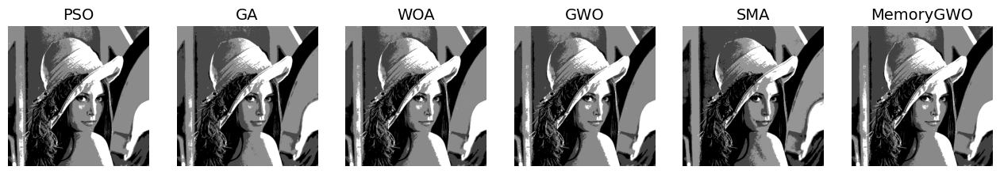

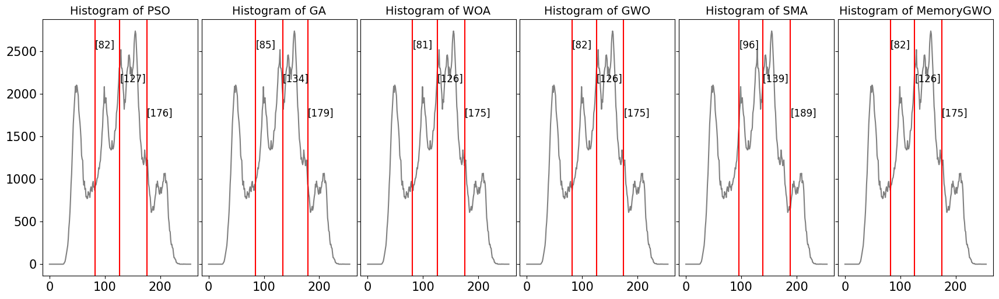

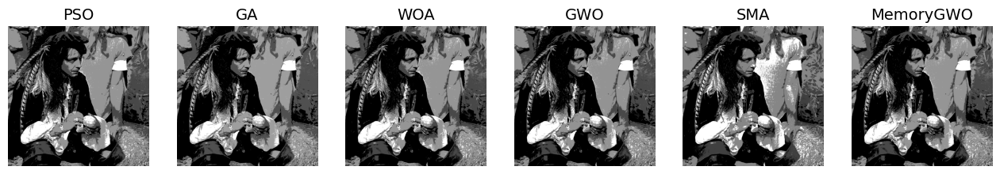

...

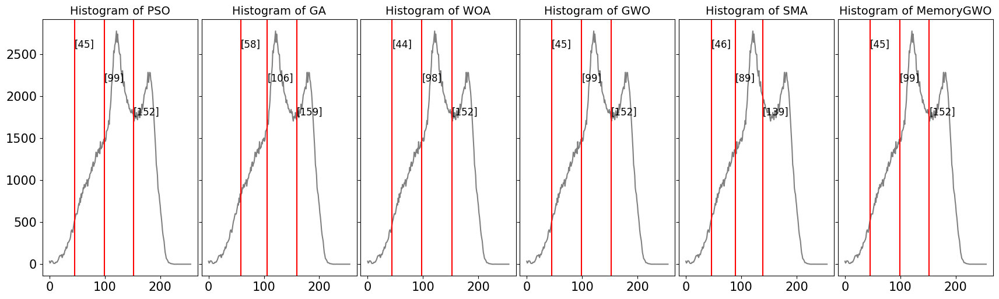

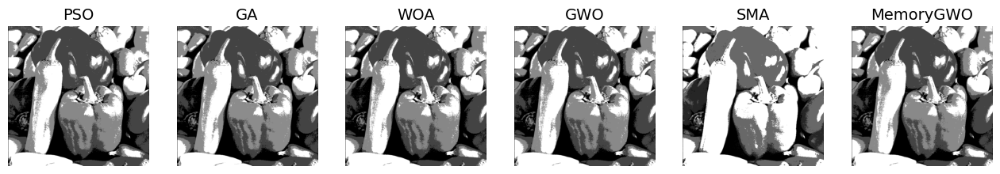

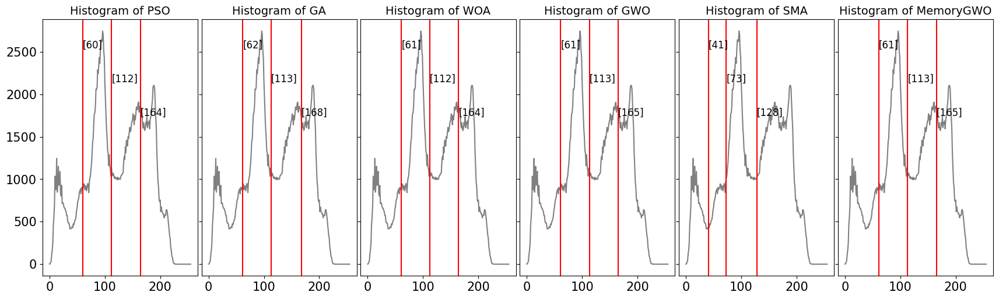

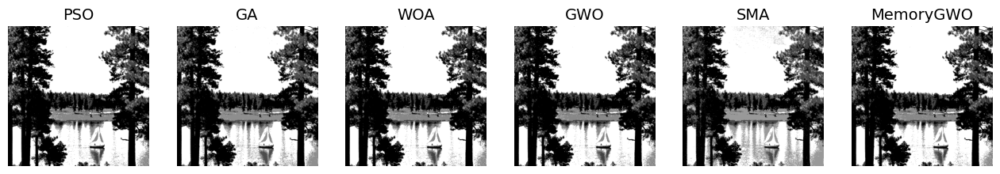

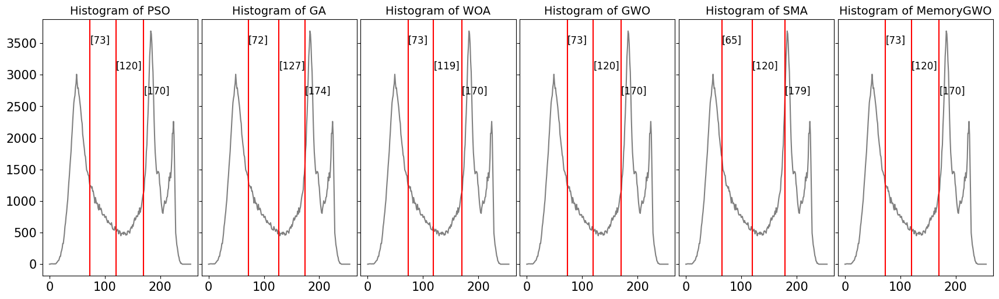

In [24]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16, 7))
#     fig.suptitle('Segmented Image of {} and Its Histogram'.format(image_name), fontsize=18)
    fig, ax_row2 = plt.subplots(
        nrows=1, ncols=len(algorithms), 
        figsize=(17,5), 
        sharey=True
    )
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=14)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo), fontsize=14)
        ax_row2[idx].tick_params(axis='x', labelsize=15)
        ax_row2[idx].tick_params(axis='y', labelsize=15)
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=400
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)

## 4-Level

In [25]:
mLevel = 4
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,2,4,"[62, 101, 146, 184]","[66, 107, 146, 186]","[63, 102, 142, 185]","[66, 105, 145, 185]","[55, 107, 162, 194]","[66, 106, 145, 185]"
Lena.png,6,4,"[73, 109, 146, 188]","[73, 112, 151, 186]","[65, 98, 138, 179]","[69, 105, 143, 181]","[68, 110, 155, 198]","[68, 103, 142, 181]"
Male.tiff,10,4,"[56, 100, 149, 194]","[47, 90, 133, 176]","[46, 90, 135, 180]","[46, 90, 133, 175]","[54, 112, 164, 213]","[47, 91, 133, 175]"
Mandrill.tiff,14,4,"[44, 88, 130, 171]","[34, 74, 115, 160]","[32, 71, 113, 159]","[35, 74, 115, 160]","[51, 98, 147, 189]","[35, 75, 115, 160]"
Peppers.tiff,18,4,"[48, 89, 135, 181]","[46, 84, 128, 173]","[48, 89, 133, 179]","[53, 97, 140, 186]","[39, 91, 148, 188]","[54, 99, 143, 189]"
Sailboat on lake.tiff,22,4,"[62, 106, 147, 188]","[71, 112, 156, 194]","[69, 111, 156, 195]","[71, 113, 157, 196]","[51, 99, 148, 197]","[71, 113, 157, 196]"


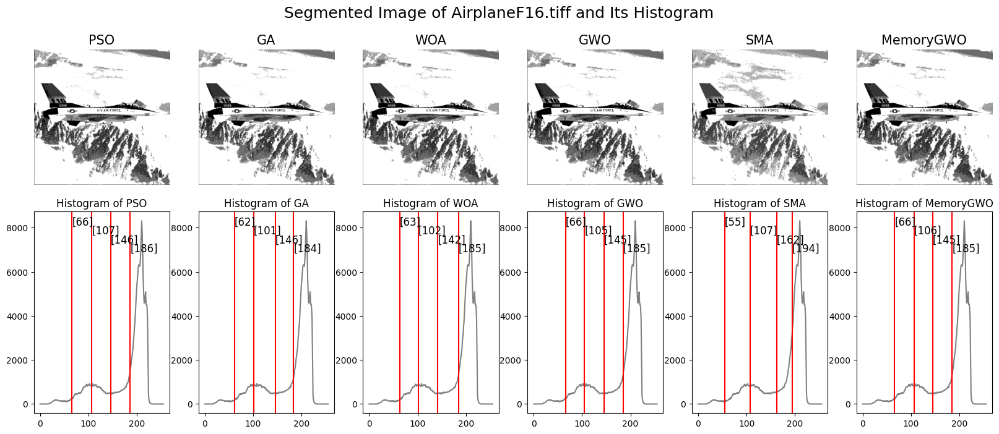

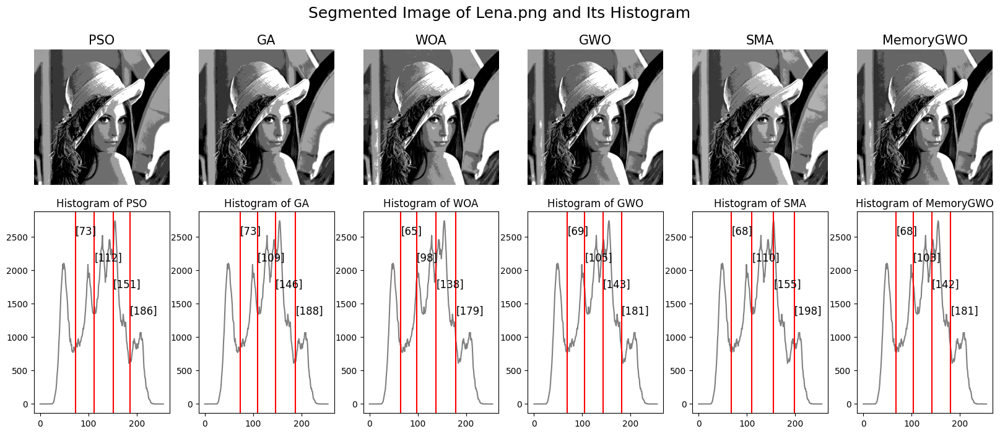

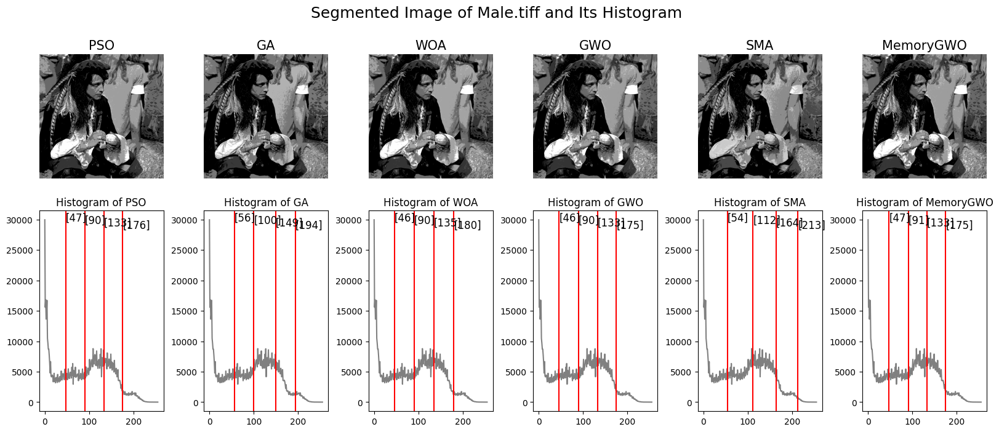

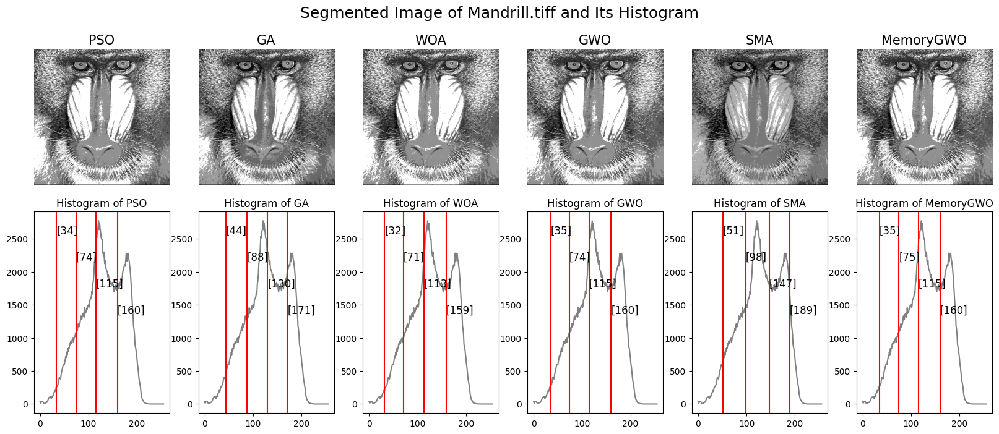

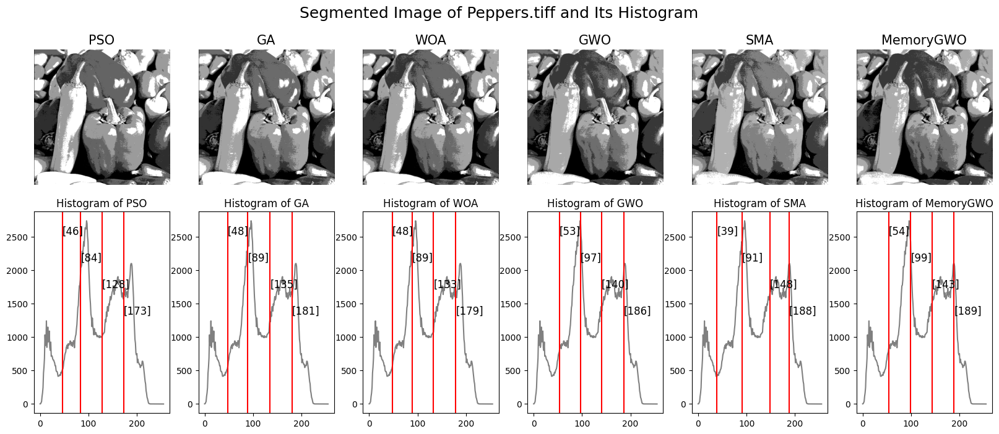

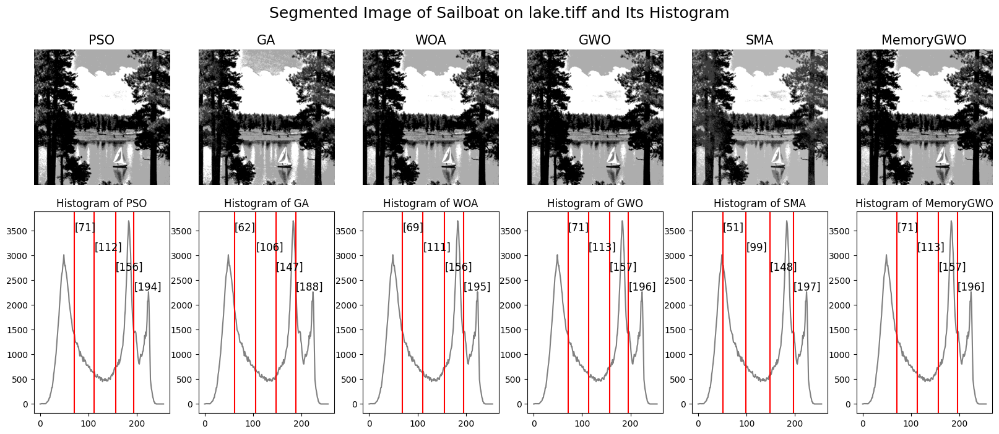

In [26]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, (ax_row1, ax_row2) = plt.subplots(nrows=2, ncols=len(algorithms), figsize=(16, 7))
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo))
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=400
    fig.suptitle('Segmented Image of {} and Its Histogram'.format(image_name), fontsize=18)
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)

## 5-Level

In [27]:
mLevel = 5
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,3,5,"[55, 88, 121, 153, 188]","[62, 93, 127, 159, 188]","[55, 86, 120, 153, 187]","[59, 89, 123, 156, 188]","[52, 93, 131, 172, 203]","[60, 89, 123, 156, 187]"
Lena.png,7,5,"[64, 95, 128, 160, 191]","[65, 95, 128, 162, 195]","[62, 92, 126, 161, 192]","[63, 94, 127, 163, 194]","[46, 82, 124, 165, 201]","[63, 94, 128, 163, 194]"
Male.tiff,11,5,"[37, 78, 123, 166, 209]","[41, 82, 123, 166, 216]","[38, 80, 122, 167, 218]","[43, 87, 130, 173, 227]","[50, 106, 150, 192, 227]","[42, 85, 129, 172, 227]"
Mandrill.tiff,15,5,"[39, 70, 104, 138, 179]","[30, 64, 100, 135, 170]","[29, 62, 98, 134, 170]","[31, 67, 102, 137, 172]","[32, 74, 114, 150, 191]","[33, 68, 104, 138, 172]"
Peppers.tiff,19,5,"[43, 78, 116, 149, 185]","[39, 74, 109, 149, 190]","[38, 74, 111, 151, 194]","[42, 77, 113, 153, 195]","[35, 78, 122, 161, 194]","[42, 77, 113, 153, 195]"
Sailboat on lake.tiff,23,5,"[48, 82, 118, 152, 188]","[64, 99, 133, 168, 199]","[49, 85, 122, 162, 197]","[57, 91, 127, 165, 198]","[37, 80, 118, 159, 199]","[58, 92, 128, 165, 198]"


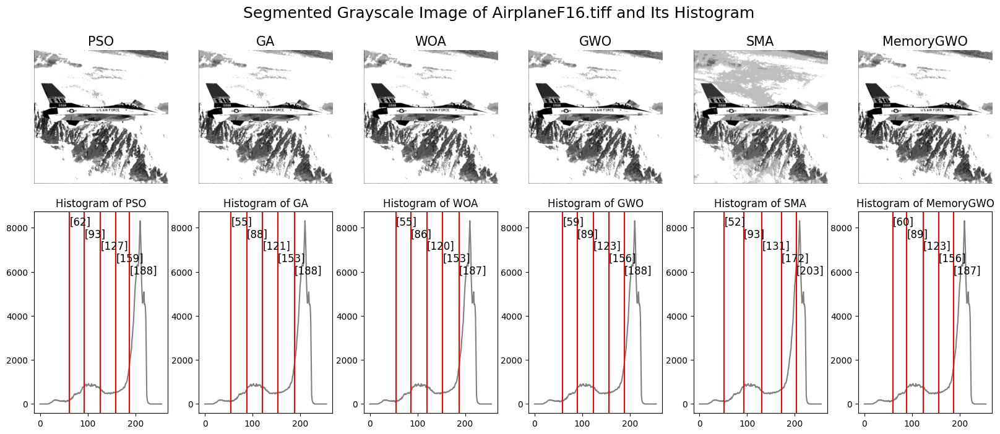

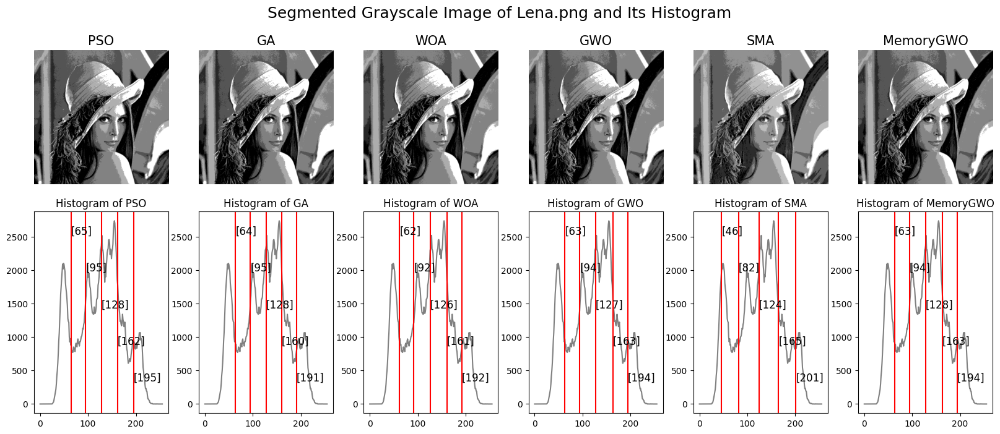

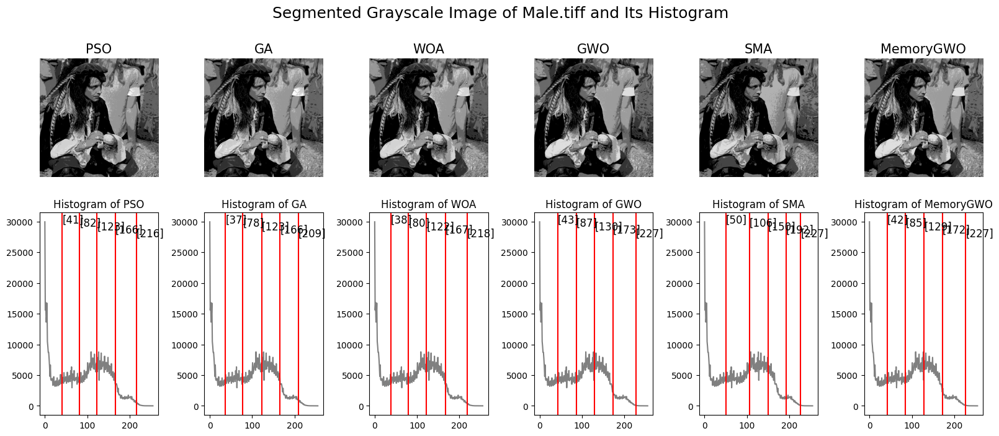

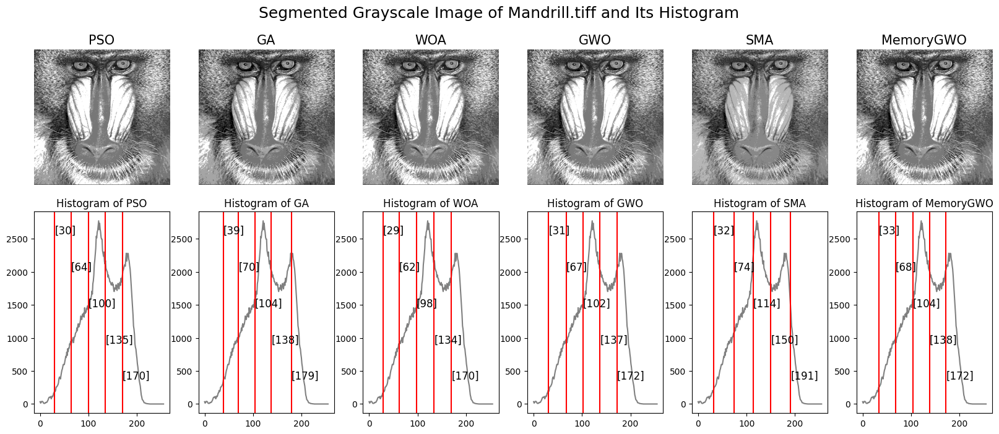

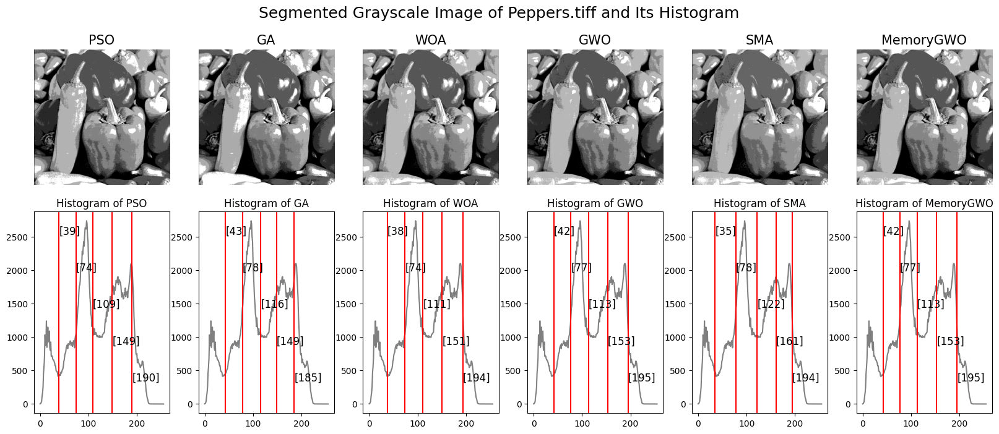

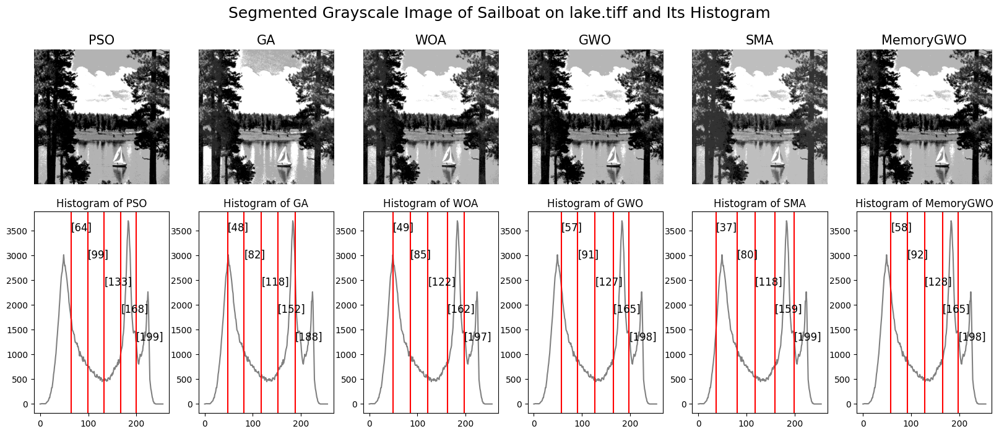

In [28]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, (ax_row1, ax_row2) = plt.subplots(nrows=2, ncols=len(algorithms), figsize=(16, 7))
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo))
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=550
    fig.suptitle('Segmented Grayscale Image of {} and Its Histogram'.format(image_name), fontsize=18)
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)